# Word Clouds (but now, even fancier)

Word clouds have recently attracted a lot of attention for their simplicity in showing word frequencies in an interesting way. Technically, this type of graph is based on n-grams that are contiguous sequences of items from a sample of text or speech. Put in a chart; you can easily see which topics, words, or emotions are most common in the data.

Before you start, make sure you have all you need:

* To create a word cloud: `wordcloud`
* To import an image: `pillow` (will later import is as PIL)
* To scrape text from Wikipedia: `wikipedia`. This one is optional, you can instead load up or create your own text data without having to pull text via web scraping.

Remember, before importing packages, you must have them installed. For example, in Anaconda Prompt try

`conda install -c conda-forge wikipedia`

## Option 1
In Anaconda Navigator if `wordcloud` or `wikipedia` are missing from search, add a new channel by clicking on `Channels` button. A small window will popup where you can `Add` more repositories. Add 'conda-forge' - it contains many more packages. I was able to find wordcloud and wikipedia and istall it manually without `conda` or `pip`.

## Option 2
`pip install wikipedia`

`pip install wordcloud`

## Option 3 (recommended)
```python
import sys
!{sys.executable} -m pip install wikipedia
!{sys.executable} -m pip install wordcloud
```

In [3]:
# Import packages
import wikipedia
import re
import numpy as np
import matplotlib.pyplot as plt

from wordcloud import WordCloud, STOPWORDS
from PIL import Image

# Load data

In [6]:
# Specify the title of the Wikipedia page
wiki = wikipedia.page('Sydney')  # Extract the plain text content of the page
text = wiki.content
print(text[:1000]) #NEW: prints the first 1000 characteters (similar to .head() command)

Sydney is the capital city of the state of New South Wales, and the most populous city in Australia. Located on Australia's east coast, the metropolis surrounds Sydney Harbour and extends about 80 km (50 mi) from the Pacific Ocean in the east to the Blue Mountains in the west, and about 80 km (50 mi) from the Ku-ring-gai Chase National Park and the Hawkesbury River in the north and north-west, to the Royal National Park and Macarthur in the south and south-west. Greater Sydney consists of 658 suburbs, spread across 33 local government areas. Residents of the city are colloquially known as "Sydneysiders". The estimated population in June 2022 was 5,297,089; the city is home to approximately 66% of the state's population. The city's nicknames include the "Emerald City" and the "Harbour City".Aboriginal Australians have inhabited the Greater Sydney region for at least 30,000 years, and Aboriginal engravings and cultural sites are common. The traditional custodians of the land on which mod

In [8]:
# Clean text
text = re.sub(r'==.*?==+', '', text)
text = text.replace('\n', '')
print(text[-1000:]) #NEW: prints the last 1000 characteters (similar to .head() command)

ctions on an average weekday. Transport developments in the north-west and east of the city have been designed to encourage use of the expanding public transportation system.List of museums in SydneyList of people from SydneyList of public art in the City of SydneyList of songs about SydneyOutline of SydneyOfficial Sydney, NSW government siteOfficial Sydney tourism siteHistorical film clips of Sydney on the National Film and Sound Archive of Australia's australianscreen onlineQantas Farewell Flight B747-400 Queen of the Skies – Sydney Final Flight QF747 on YouTube – includes a low-level joyflight around Sydney showing various aspects of the city on 13 July 2020 (starts at 05:20)13766899  Sydney on OpenStreetMapDictionary of Sydney – the history of Sydney (Archived 24 March 2019 at the Wayback Machine)Sydney Official History ArchivesState Records New South WalesNational Archives of AustraliaUnderstanding Society Through its Records – John Curtin LibraryDirectory of Archives in Australia

# Word Cloud

In [11]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30)) # Set figure size
    plt.imshow(wordcloud)        # Display image
    plt.axis("off");             # No axis details

In [13]:
help(WordCloud) #NEW: get help on a function and its options

Help on class WordCloud in module wordcloud.wordcloud:

class WordCloud(builtins.object)
 |  WordCloud(font_path=None, width=400, height=200, margin=2, ranks_only=None, prefer_horizontal=0.9, mask=None, scale=1, color_func=None, max_words=200, min_font_size=4, stopwords=None, random_state=None, background_color='black', max_font_size=None, font_step=1, mode='RGB', relative_scaling='auto', regexp=None, collocations=True, colormap=None, normalize_plurals=True, contour_width=0, contour_color='black', repeat=False, include_numbers=False, min_word_length=0, collocation_threshold=30)
 |  
 |  Word cloud object for generating and drawing.
 |  
 |  Parameters
 |  ----------
 |  font_path : string
 |      Font path to the font that will be used (OTF or TTF).
 |      Defaults to DroidSansMono path on a Linux machine. If you are on
 |      another OS or don't have this font, you need to adjust this path.
 |  
 |  width : int (default=400)
 |      Width of the canvas.
 |  
 |  height : int (defaul

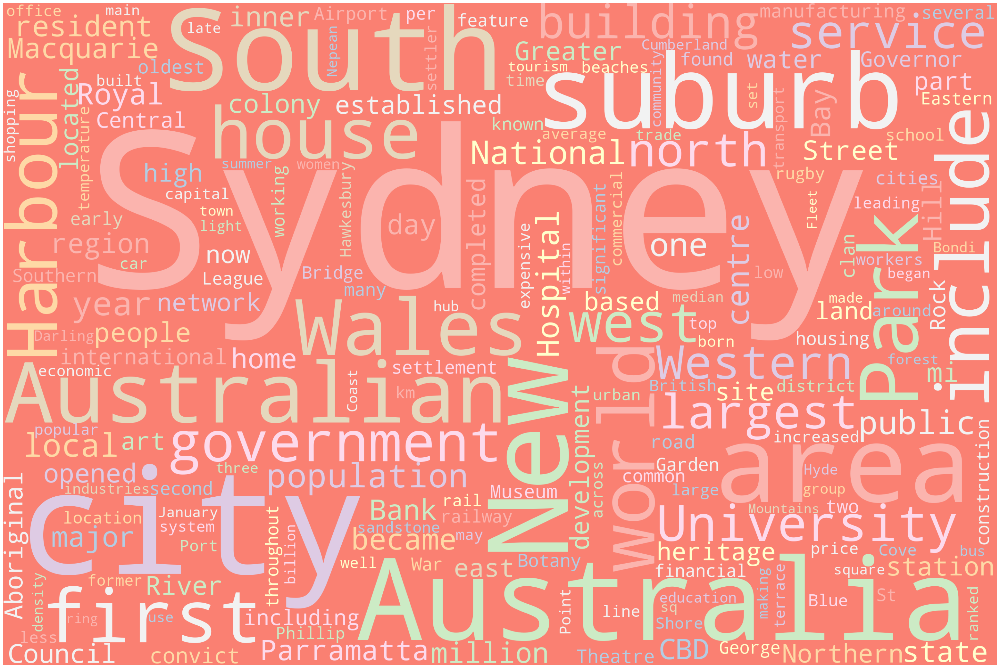

In [15]:
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='salmon', colormap='Pastel1', \
                      collocations=False, stopwords = STOPWORDS).generate(text)

# Note the long code line splitting with '\' in above.
# Colors: http://www.science.smith.edu/dftwiki/index.php/Color_Charts_for_TKinter
# Colormaps: https://matplotlib.org/3.2.1/tutorials/colors/colormaps.html

# Plot
plot_cloud(wordcloud)

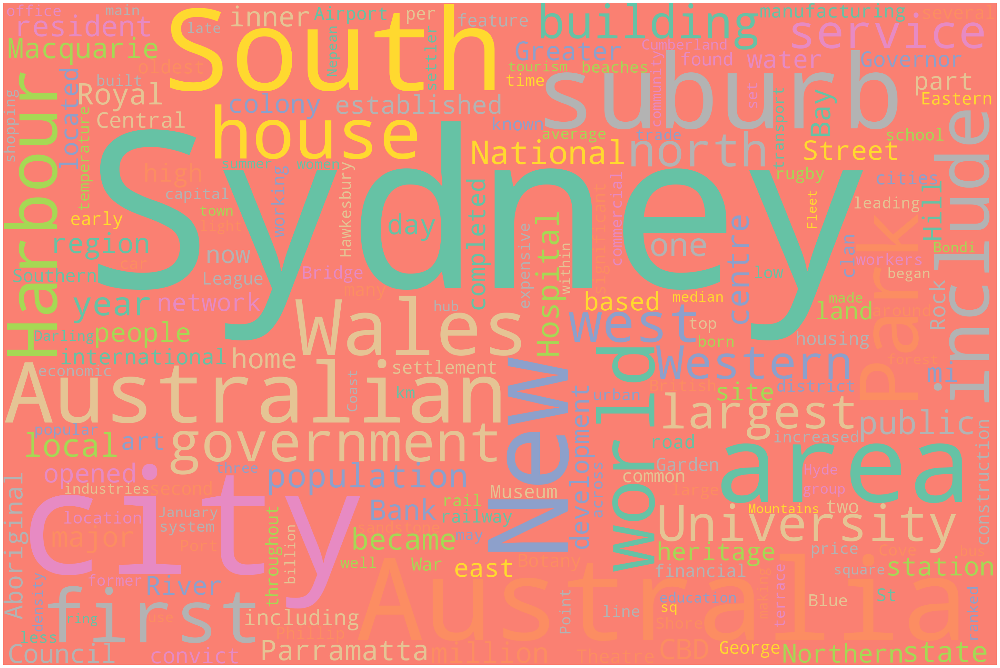

In [17]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='salmon', colormap='Set2', \
                      collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

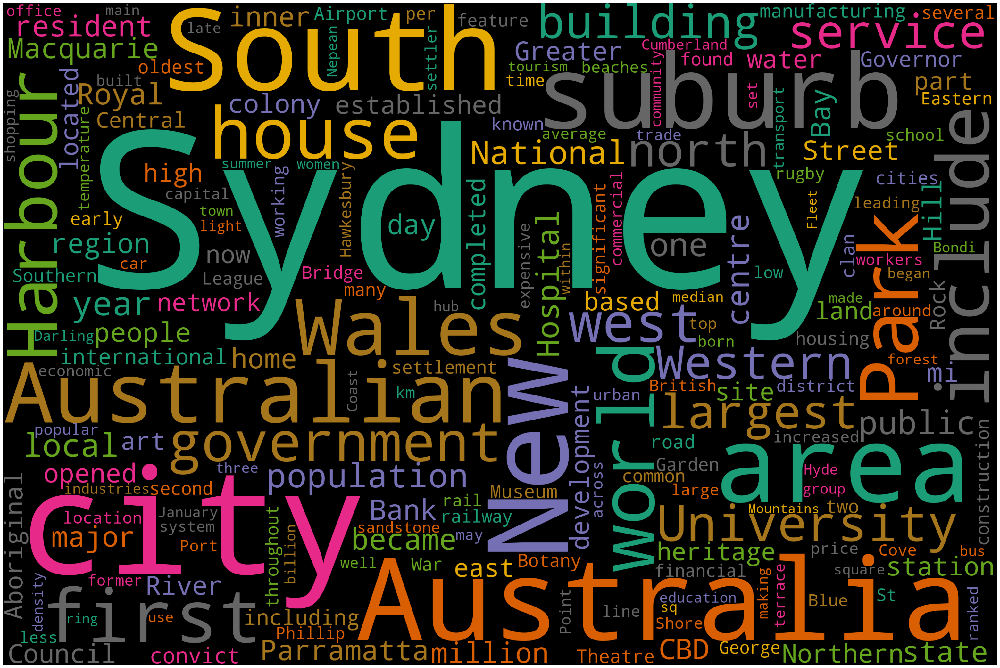

In [19]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='black', colormap='Dark2', \
                      collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

# Fancier word cloud

In [22]:
# Import image to np.array
#mask = np.array(Image.open('upvote.png'))
mask = np.array(Image.open('./Images/star.png')) #NEW: Specify directory ('.' current)
#mask = np.array(Image.open('../More Images/user.png')) #NEW: Specify directory ('..' the parent of current)

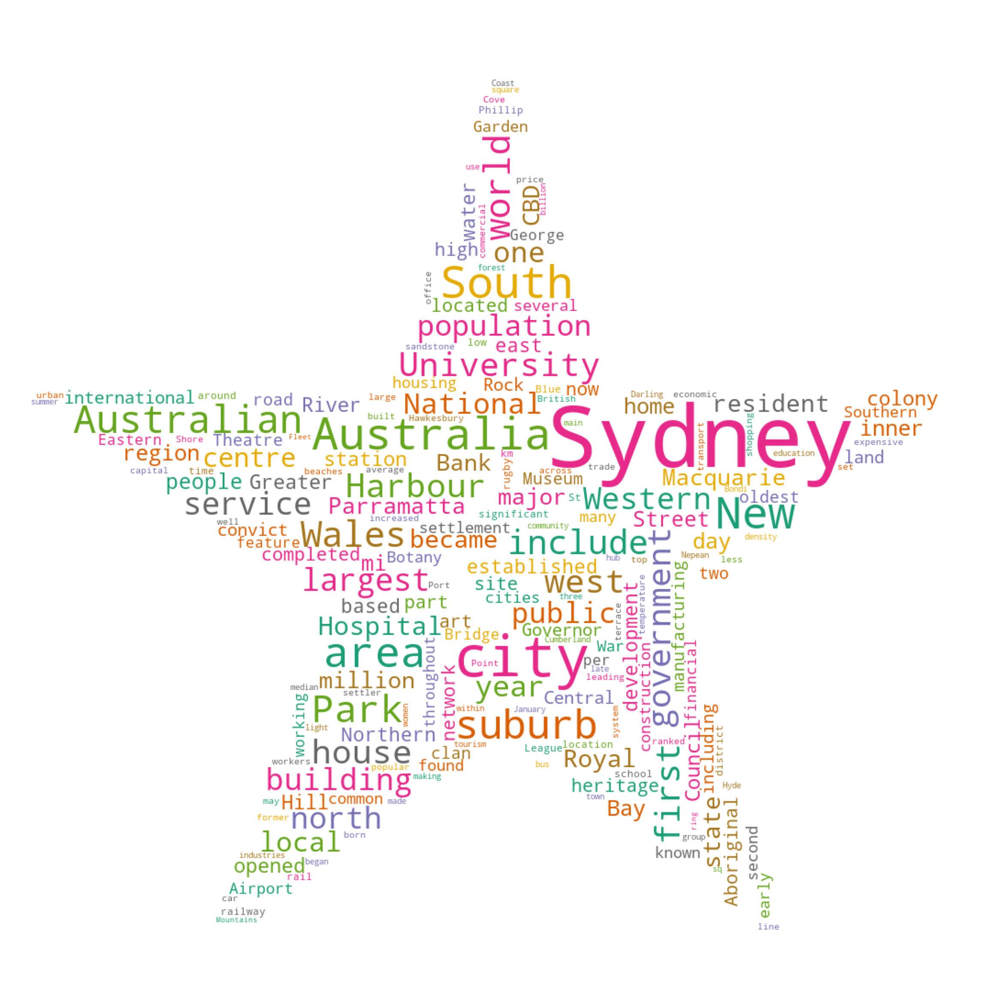

In [24]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='white', colormap='Dark2', \
                      collocations=False, stopwords = STOPWORDS, mask=mask).generate(text)
plot_cloud(wordcloud)

## Update stopwords for your specific text
The built in list of stopwords might not neccessarily be adopted to your specific needs. 


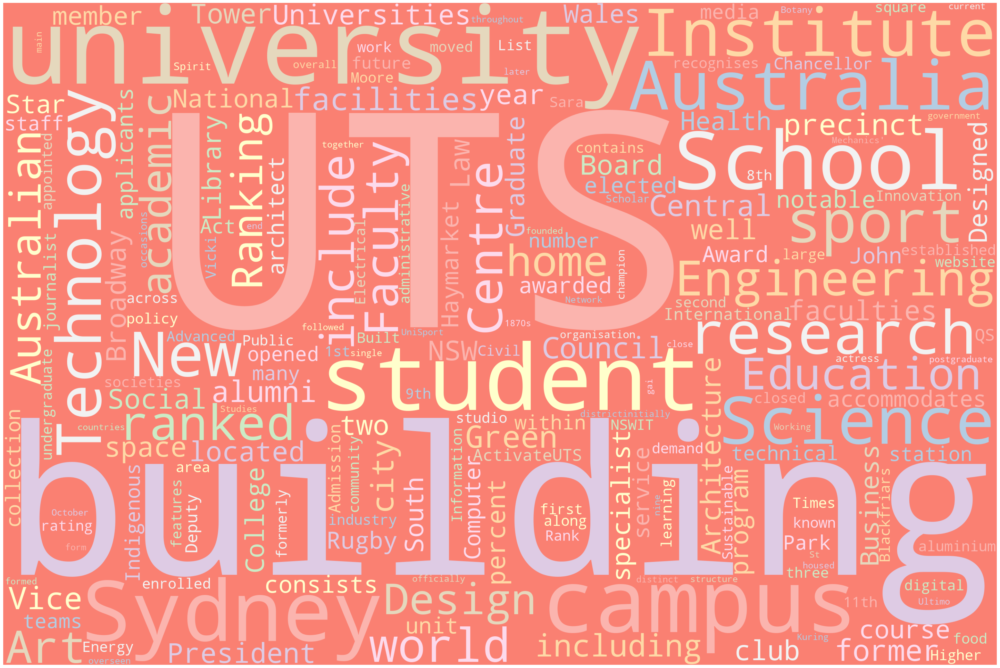

In [27]:
wiki = wikipedia.page('University of Technology Sydney')  # Extract the plain text content of the page
text = wiki.content
text = re.sub(r'==.*?==+', '', text)
text = text.replace('\n', '')
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='salmon', colormap='Pastel1', \
                      collocations=False, stopwords = STOPWORDS).generate(text)
plot_cloud(wordcloud)

The frequency, and as a result larger font size, of words **Building**, **include**, and **located** is a bit annoying. 

In [30]:
newstopwords = set(STOPWORDS)
print(newstopwords)

{'have', 'and', 'but', "didn't", "that's", 'hers', "wouldn't", 'herself', "shouldn't", 'by', 'itself', 'out', 'most', "how's", 'our', 'ourselves', 'it', 'since', 'how', 'off', 'be', "it's", "mustn't", 'com', 'his', "he'll", 'we', "i've", 'few', "they're", "don't", 'each', 'for', "you've", 'in', 'why', 'after', 'below', "we've", "you'd", 'about', 'as', 'is', "they've", 'once', 'that', 'were', 'you', 'which', 'also', 'this', 'under', "i'm", "where's", 'with', 'just', "we'd", 'all', 'there', 'me', 'both', 'my', "he's", 'down', 'else', 'shall', 'if', 'over', "they'd", 'yourselves', 'no', 'like', 'so', 'could', 'should', 'he', 'those', 'a', 'same', 'against', 'are', 'being', 'themselves', 'hence', "why's", 'www', 'more', "we'll", "who's", "can't", "she's", "here's", 'the', 'otherwise', 'doing', 'or', "we're", 'other', 'while', 'because', "hadn't", "hasn't", 'again', "wasn't", 'yours', "couldn't", 'ever', 'would', 'them', 'very', 'when', 'here', 'r', 'too', 'i', 'however', 'up', "she'd", 'th

In [32]:
newstopwords.update(["building","include","located"])
print(newstopwords)

{'have', 'and', 'but', "didn't", 'building', "that's", 'hers', "wouldn't", 'herself', "shouldn't", 'by', 'itself', 'out', 'most', "how's", 'our', 'ourselves', 'it', 'since', 'how', 'off', 'be', "it's", "mustn't", 'com', 'his', "he'll", 'we', "i've", 'few', "they're", 'include', "don't", 'each', 'for', "you've", 'in', 'why', 'after', 'below', "we've", "you'd", 'about', 'as', 'is', "they've", 'once', 'that', 'were', 'you', 'which', 'also', 'this', 'under', "i'm", "where's", 'with', 'just', "we'd", 'all', 'there', 'me', 'both', 'my', "he's", 'down', 'else', 'shall', 'if', 'over', "they'd", 'yourselves', 'no', 'like', 'so', 'could', 'should', 'he', 'those', 'a', 'same', 'located', 'against', 'are', 'being', 'themselves', 'hence', "why's", 'www', 'more', "we'll", "who's", "can't", "she's", "here's", 'the', 'otherwise', 'doing', 'or', "we're", 'other', 'while', 'because', "hadn't", "hasn't", 'again', "wasn't", 'yours', "couldn't", 'ever', 'would', 'them', 'very', 'when', 'here', 'r', 'too', 

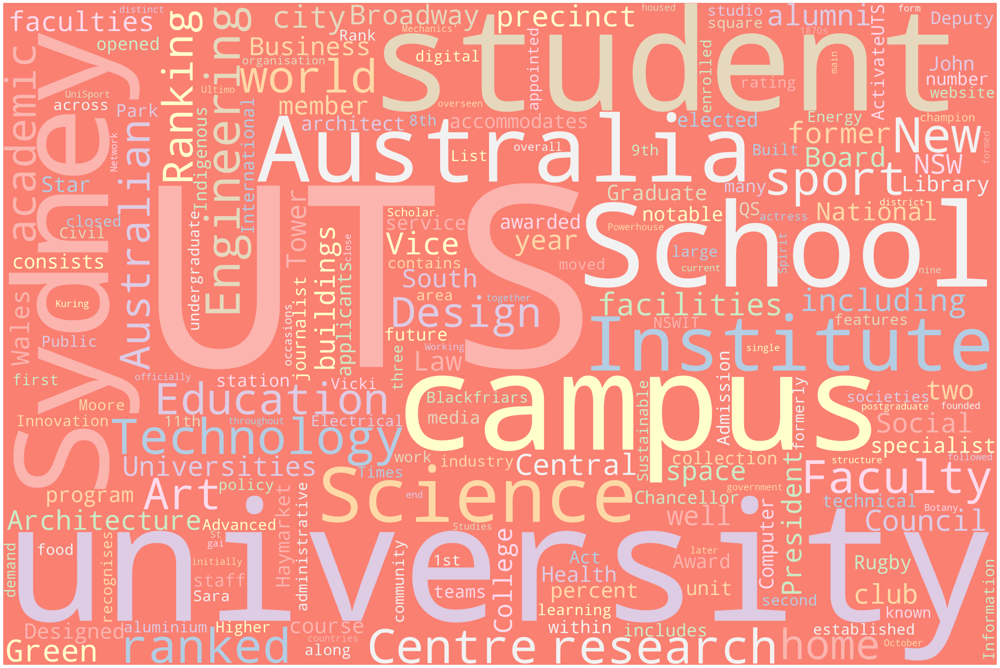

In [34]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='salmon', colormap='Pastel1', \
                      collocations=False, stopwords = newstopwords).generate(text)
plot_cloud(wordcloud)

## Creating wordcloud following a color pattern
The color mapping is done before you plot the cloud using the `ImageColorGenerator` function from `WordCloud` library. Please review the list of supported image file formats [here](https://pillow.readthedocs.io/en/5.1.x/handbook/image-file-formats.html).

In [37]:
mask = np.array(Image.open("./Images/AustraliaKangaroo.png"))

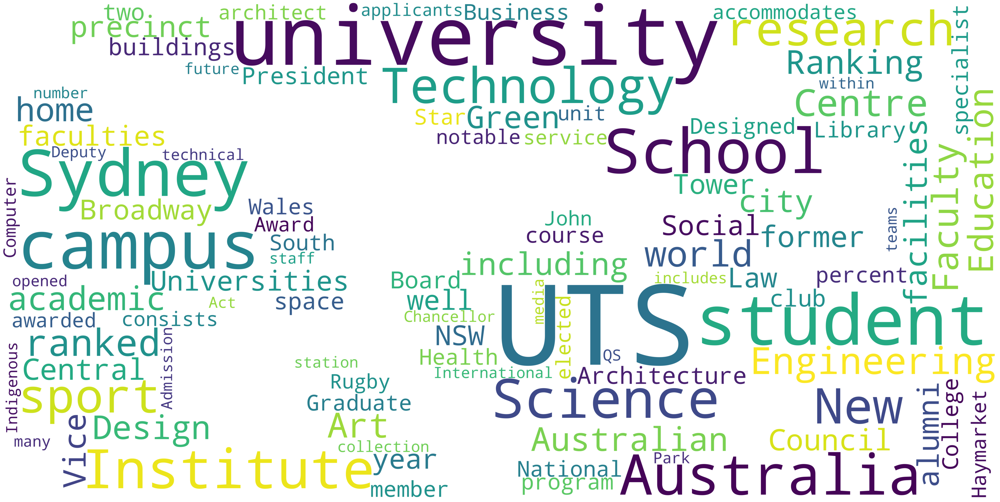

In [39]:
wordcloud_flag = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='white', mode='RGBA', mask=mask, max_words=100,\
                      collocations=False, stopwords = newstopwords).generate(text)

plot_cloud(wordcloud_flag) # we will be changing `max_words=100` parameter until we are starting to see shape

# max_words : number (default=200)    The maximum number of words.
# Why do we need to increase the number of words in a cloud?
# If you use the default 200, the cloud is too sparse to see all the shade gradients of the underlying image. 
# try removing "max_words=1000" from the command above and re-generate the cloud image.

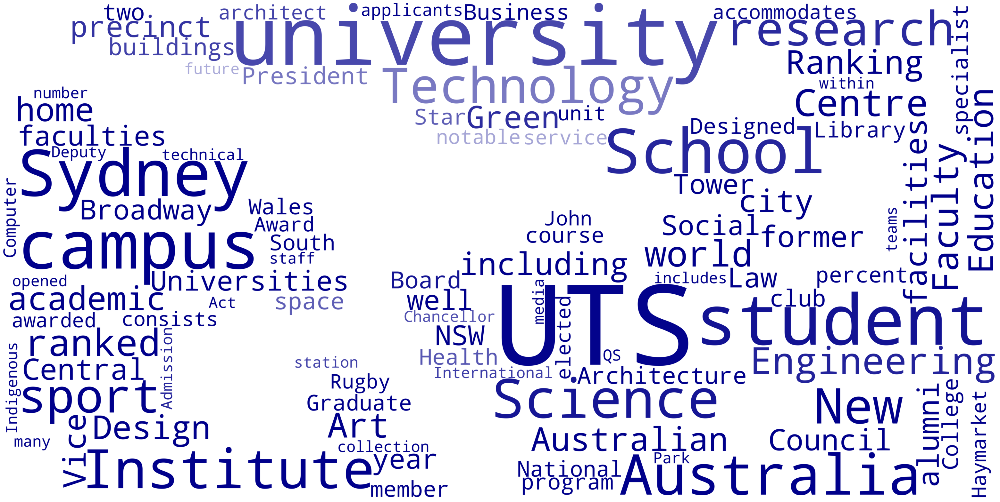

In [41]:
from wordcloud import ImageColorGenerator

# create coloring from image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[40,30])
plt.imshow(wordcloud_flag.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
plt.show()

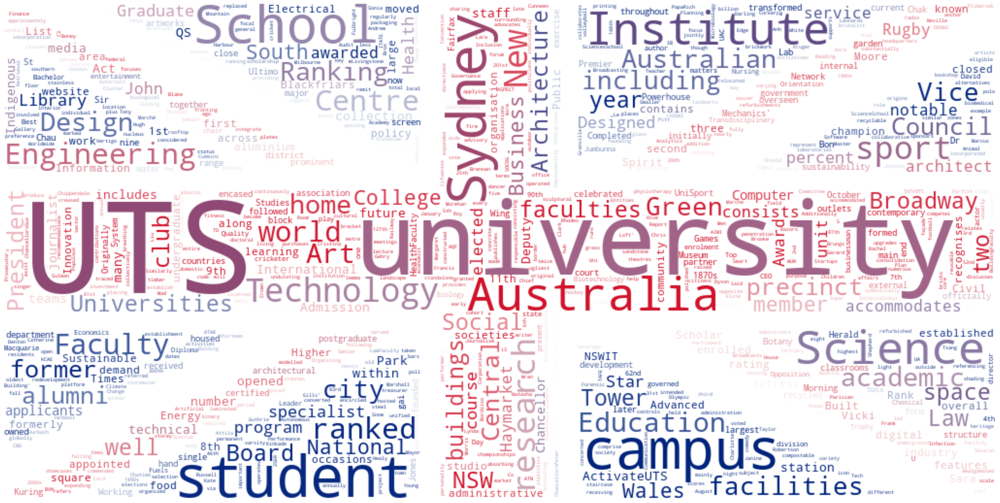

In [43]:
mask = np.array(Image.open("./Images/UK.jpg"))
wordcloud_flag = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='white', mode='RGBA', mask=mask, max_words=1000,\
                      collocations=False, stopwords = newstopwords).generate(text)
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[40,30])
plt.imshow(wordcloud_flag.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")

# store to file
plt.savefig("./Images/UK_flag_wordcloud.png", format="png")

plt.show()

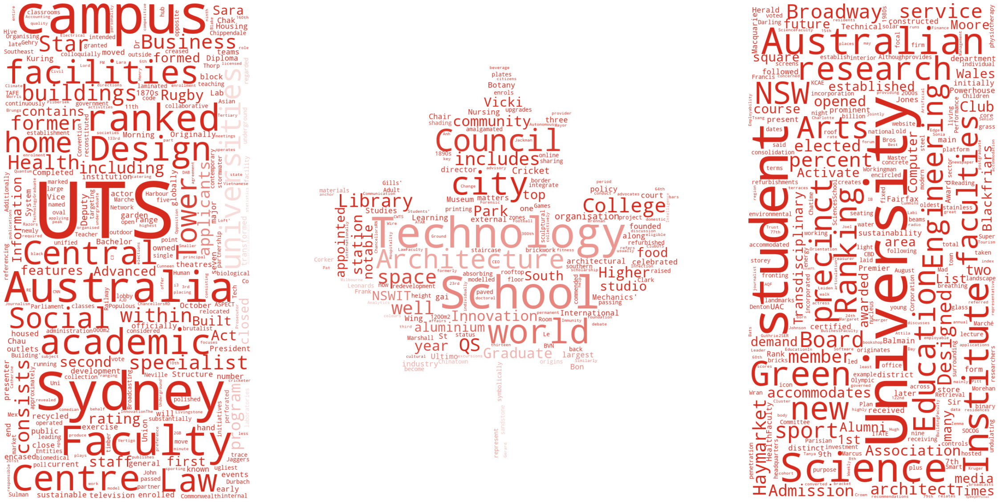

In [47]:
mask = np.array(Image.open("./Images/Canada.png"))
wordcloud_flag = WordCloud(width = 3000, height = 2000, random_state=1, \
                      background_color='white', mode='RGBA', mask=mask, max_words=1000,\
                      collocations=False, stopwords = newstopwords).generate(text)
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[40,30])
plt.imshow(wordcloud_flag.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis("off")
plt.show()

## You made it! 
You have learned several ways to draw a WordCloud that would be helpful for visualization of any text analysis. You also learn how to mask the cloud into any shape, using any color of your choice.

## More examples

**Animated word clouds** are a fantastic way of telling a story about your data. Michael Kane and his colleagues collected 250 most frequent words found in the Science journal abstracts from 1980 to 2014, and developed a dynamic version of word cloud, called **the Word Swarm**. The Python codes are freely available from their [GitHub](https://github.com/thisIsMikeKane/WordSwarm) under the terms of public license. Check their final results on [YouTube](https://www.youtube.com/playlist?list=PLW9BhSPL6nfRFieaT0mqaAiZhA1ZFRzWX).